## Setup

This notebook post-processes ilastik **Label** exports (`*_Labels.h5`) into UNet-ready multi-label masks and paired images.  
It provides:
- loading of ilastik label masks (`.h5` → integer labels),
- optional filling of unlabeled pixels (class `0`) via nearest labeled neighbor,
- morphological smoothing (binary opening) for cleaner boundaries,
- image/mask size harmonization,
- one-hot, non-overlapping multi-label stacks,
- export to `PNG` (images) and compressed `NPZ` (masks).

**Dependencies:** `h5py`, `numpy`, `matplotlib`, `PIL`, `scikit-image`, `scipy.ndimage`, `opencv-python`, `glob`, `re`.



In [ ]:
import h5py
import numpy as np
import matplotlib.pyplot as plt
import glob
from skimage.transform import resize
from scipy.ndimage import distance_transform_edt
from scipy.ndimage import binary_opening
from PIL import Image
import re
from skimage.transform import resize
from matplotlib.colors import ListedColormap
from collections import defaultdict

import os
import numpy as np
import cv2
import re
import h5py
import matplotlib.pyplot as plt
from PIL import Image
from glob import glob
from collections import defaultdict
from matplotlib.backends.backend_pdf import PdfPages
from skimage.transform import resize

## Workspace and paths

Mount Google Drive (Colab) and define I/O:

- `BASE_DIR`: folder containing the source `*_Labels.h5` files and corresponding raw images.
- `OUTPUT_DIR`: root output folder.
- `UNET_IMAGE_DIR`: destination for resized **input images** (`.png`).
- `UNET_MASK_DIR`: destination for **multi-label masks** (`.npz`, one-hot).

> 🔧 Update `BASE_DIR` to your dataset path before running.  
The required directories are created if they do not exist.


In [ ]:
from google.colab import drive
import os

# Mount Google Drive
drive.mount('/content/drive')

# Define input folder with Ilastik label files and output folder for masks
BASE_DIR = '/content/drive/MyDrive/02 ACCORDS/ACC_ImageCharacterisation/notebooks/ilastik/images_normalized/27_06_2026_output_TRAINING_SET_1_prep/Batch_1'  # Update this path if needed
OUTPUT_DIR = os.path.join(BASE_DIR, 'masks_output_pipe')
UNET_IMAGE_DIR = os.path.join(OUTPUT_DIR, 'net_input_images')
UNET_MASK_DIR = os.path.join(OUTPUT_DIR, 'net_input_masks')

# Create output directories
os.makedirs(OUTPUT_DIR, exist_ok=True)
os.makedirs(UNET_IMAGE_DIR, exist_ok=True)
os.makedirs(UNET_MASK_DIR, exist_ok=True)


print("Working folder:", BASE_DIR)
print("Output folder for masks:", OUTPUT_DIR)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Working folder: /content/drive/MyDrive/02 ACCORDS/ACC_ImageCharacterisation/notebooks/ilastik/images_normalized/27_06_2026_output_TRAINING_SET_1_prep/Batch_1
Output folder for masks: /content/drive/MyDrive/02 ACCORDS/ACC_ImageCharacterisation/notebooks/ilastik/images_normalized/27_06_2026_output_TRAINING_SET_1_prep/Batch_1/masks_output_pipe


## In-memory stores

Dictionaries to collect intermediate and final artifacts:

- `masks_raw`, `masks_cleaned`, `masks_smoothed`: per-image integer label masks at different stages.
- `images`, `images_resized`: original and resized images.
- `mask_channels`: per-image channel list `[GFM, carbonhole, undefined]`; each entry is a binary mask (H×W) or `None`.


In [ ]:
# Store intermediate results
masks_raw = {}
masks_cleaned = {}
masks_smoothed = {}
images = {}

mask_channels = defaultdict(lambda: [None, None, None])  # [GFM, carbonhole, undefined]
images_resized = {}

## Load ilastik label mask

`load_label_mask(h5_path, target_shape=(512, 512))`

- Reads `exported_data` from the H5 file.
- Squeezes to 2D integer labels.
- Resizes to `target_shape` using **nearest neighbor** (`order=0`, `preserve_range=True`) to keep class integers intact.
- Returns `uint8` mask with discrete classes (e.g., 0 = unlabeled, 1 = background, 2 = target).


In [ ]:
def load_label_mask(h5_path, target_shape=(512, 512)):
    with h5py.File(h5_path, 'r') as f:
        data = f['exported_data'][()]
        mask = np.squeeze(data)

    original_shape = mask.shape
    if original_shape != target_shape:
        print(f"🔄 Resizing mask from {original_shape} to {target_shape}")
        mask = resize(
            mask,
            target_shape,
            order=0,                 # zachowuje klasy
            preserve_range=True,     # nie zmienia wartości klas
            anti_aliasing=False
        ).astype(np.uint8)
    else:
        print(f"✅ Mask already has target shape {target_shape}, no resize needed.")

    return mask


## Fill unlabeled pixels (class 0) by nearest labeled class

`remove_class_0_with_nearest(mask)`

- Finds all pixels labeled `0` and replaces each with the **nearest** non-zero class using `distance_transform_edt` indices.
- Useful when ilastik labels contain gaps/voids.

Additional helpers in this cell provide overlay visualization to compare original vs. smoothed masks.


In [ ]:
def remove_class_0_with_nearest(mask):
    """
    Finds all pixels labeled `0` and replaces each with the **nearest** non-zero class using `distance_transform_edt` indices.
    """
    mask = mask.copy()

    # Znajdź piksele klasy 0
    mask_0 = (mask == 0)

    if not np.any(mask_0):
        print("✅ No class 0 to replace.")
        return mask

    # Wyznacz współrzędne najbliższych pikseli ≠ 0
    distance, indices = distance_transform_edt(mask_0, return_indices=True)

    # indices ma shape (2, H, W): [0] = y, [1] = x
    nearest_y = indices[0]
    nearest_x = indices[1]

    # Zastąp piksele 0 ich najbliższą sąsiednią klasą
    filled = mask.copy()
    filled[mask_0] = mask[nearest_y[mask_0], nearest_x[mask_0]]

    return filled

## Morphological smoothing of the target class

`simple_smooth_mask(mask, target_class=2, structure_size=3)`

- Applies **binary opening** (erosion + dilation) on the `target_class` to reduce small spurs and noise.
- Reconstructs the integer label mask so that the target class is replaced by its smoothed version.
- Clears transient zeros to background (`1`) to avoid unintended unlabeled gaps.


In [ ]:
def simple_smooth_mask(mask, target_class=2, structure_size=3):
    """
    Applies binary opening (erosion + dilation) to smooth edges of target class.
    This preserves object shapes and avoids removing large features.
    """
    binary = (mask == target_class)
    smoothed = binary_opening(binary, structure=np.ones((structure_size, structure_size)))

    # Build final mask
    new_mask = mask.copy()
    new_mask[mask == target_class] = 0  # Clear target class
    new_mask[smoothed == 1] = target_class  # Restore smoothed version
    new_mask[new_mask == 0] = 1  # turn "cleared" areas into background

    return new_mask


## Match corresponding raw image

`find_corresponding_image(label_path, exts=['.tiff', '.tif', '.png', '.jpg'])`

- Derives the base image name from `<image>_<object>_Labels.h5` (strips the object suffix).
- Tries candidate file paths in `BASE_DIR` across common extensions.
- Returns the first existing path (or `None` if not found).


In [ ]:
def find_corresponding_image(label_path, exts=['.tiff','.tif', '.png', '.jpg']):
    label_filename = os.path.basename(label_path).replace('_Labels.h5', '')

    # Remove known suffixes like "_GFM", "_carbonhole", "_undefined"
    # Assumes label filename is: <image_name>_<object>_Labels.h5
    match = re.match(r"^(.*)_([a-zA-Z]+)$", label_filename)
    if match:
        base_name = match.group(1)  # strip object suffix
    else:
        base_name = label_filename

    for ext in exts:
        candidate = os.path.join(BASE_DIR, base_name + ext)
        print(f"🔍 Trying: {candidate}")
        if os.path.exists(candidate):
            print("✅ Found:", candidate)
            return candidate

    print(f"❌ No match found for: {label_filename}")
    return None

def color_mask_rgb(mask):
    """
    Convert a mask with class values into an RGB image:
    - class 0 → red [255, 0, 0]       (noise/unwanted regions)
    - class 1 → white [255, 255, 255] (background)
    - class 2 → black [0, 0, 0]       (object of interest)
    """
    rgb = np.zeros((*mask.shape, 3), dtype=np.uint8)

    rgb[mask == 0] = [255, 0, 0]       # red
    rgb[mask == 1] = [255, 255, 255]   # white
    rgb[mask == 2] = [0, 0, 0]         # black

    return rgb

def show_overlay(image, mask, class_value=2, color=(0, 255, 0), alpha=0.4):
    """
    Overlay a specific class from a mask onto a grayscale image using color and transparency.
    """
    if image.shape != mask.shape:
        print(f"⚠️ Resizing image from {image.shape} to {mask.shape}")
        image = resize(image, mask.shape, preserve_range=True).astype(np.uint8)

    image_rgb = np.stack([image] * 3, axis=-1).astype(np.float32)
    color = np.array(color, dtype=np.float32)

    mask_binary = (mask == class_value)

    blended = image_rgb.copy()
    blended[mask_binary] = (
        (1 - alpha) * image_rgb[mask_binary] + alpha * color
    )

    return blended.astype(np.uint8)

import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages

def overlay_masks(original_mask, smoothed_mask, class_value=2, alpha=0.5):
    """
    Overlay smoothed mask on top of original mask.
    - original class → black
    - smoothed class → blue (with alpha)
    """
    h, w = original_mask.shape
    canvas = np.ones((h, w, 3), dtype=np.uint8) * 255  # white background

    before = (original_mask == class_value)
    after = (smoothed_mask == class_value)

    canvas[before] = [0, 0, 0]  # original = black
    canvas[after] = ((1 - alpha) * canvas[after] + alpha * np.array([0, 0, 255])).astype(np.uint8)

    return canvas


## Batch processing: build UNet-ready dataset

Parameters:
- `target_class = 2` (object of interest),
- `structure_size = 3` (smoothing kernel).

For each `*_Labels.h5` in `BASE_DIR`:
1. **Load** the raw label mask (`512×512`).
2. **Fill** class-0 pixels via nearest labeled neighbor.
3. **Smooth** the `target_class` with binary opening.
4. **Assemble channels** (e.g., `[GFM, carbonhole, undefined]`) as **non-overlapping one-hot** (H×W×3).
5. **Resize and save** the corresponding raw image to `UNET_IMAGE_DIR/<base>.png`.
6. **Save** the multi-label mask to `UNET_MASK_DIR/<base>.npz` with key `mask`.
7. **QC printouts:** per-channel pixel counts and a check for overlapping pixels (should be zero).

> Output format: `.npz` with `mask` array shaped `(H, W, C)` where `C = 3`.


Found 12 label files.

🚀 Processing: AC_UT_G_04_01_UO_200X_0001_GFM_Labels.h5
📥 Loading raw mask...
🔄 Resizing mask from (1884, 1884) to (512, 512)
✅ Raw mask shape: (512, 512)
   Unique values: [0 1 2]
🧹 Removing class 0 using nearest-neighbor...
✅ Cleaned mask unique values: [1 2]
🔧 Applying binary opening on class 2 (structure 3×3)...
✅ Filtered mask unique values: [1 2]
🔍 Trying: /content/drive/MyDrive/02 ACCORDS/ACC_ImageCharacterisation/notebooks/ilastik/images_normalized/27_06_2026_output_TRAINING_SET_1_prep/Batch_3/AC_UT_G_04_01_UO_200X_0001.tiff
✅ Found: /content/drive/MyDrive/02 ACCORDS/ACC_ImageCharacterisation/notebooks/ilastik/images_normalized/27_06_2026_output_TRAINING_SET_1_prep/Batch_3/AC_UT_G_04_01_UO_200X_0001.tiff
⚠️ Resizing image from (1884, 1884) to (512, 512)


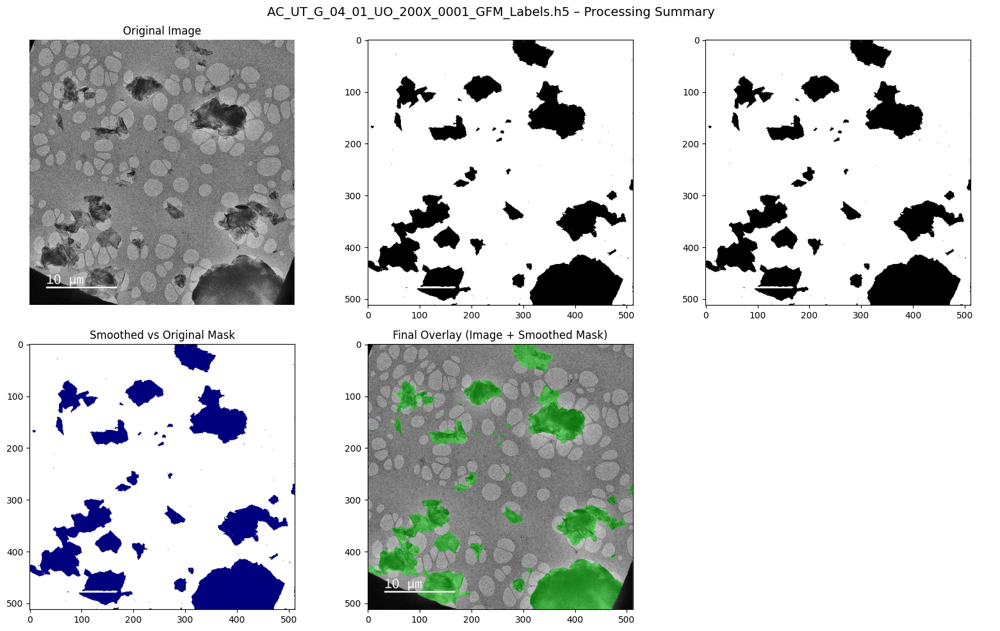

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

✅ Saved to /content/drive/MyDrive/02 ACCORDS/ACC_ImageCharacterisation/notebooks/ilastik/images_normalized/27_06_2026_output_TRAINING_SET_1_prep/Batch_3/masks_output_pipe/AC_UT_G_04_01_UO_200X_0001_GFM_processingSummary.pdf

💾 Saving final .png + .npz outputs for U-Net (with sanity-check):
❌ Skipping AC_UT_G_04_01_UO_200X_0001 — missing mask(s): carbonhole, undefined

🚀 Processing: AC_UT_G_04_01_UO_200X_0001_carbonhole_Labels.h5
📥 Loading raw mask...
🔄 Resizing mask from (1884, 1884) to (512, 512)
✅ Raw mask shape: (512, 512)
   Unique values: [1 2]
🧹 Removing class 0 using nearest-neighbor...
✅ No class 0 to replace.
✅ Cleaned mask unique values: [1 2]
🔧 Applying binary opening on class 2 (structure 3×3)...
✅ Filtered mask unique values: [1 2]
🔍 Trying: /content/drive/MyDrive/02 ACCORDS/ACC_ImageCharacterisation/notebooks/ilastik/images_normalized/27_06_2026_output_TRAINING_SET_1_prep/Batch_3/AC_UT_G_04_01_UO_200X_0001.tiff
✅ Found: /content/drive/MyDrive/02 ACCORDS/ACC_ImageCharacter

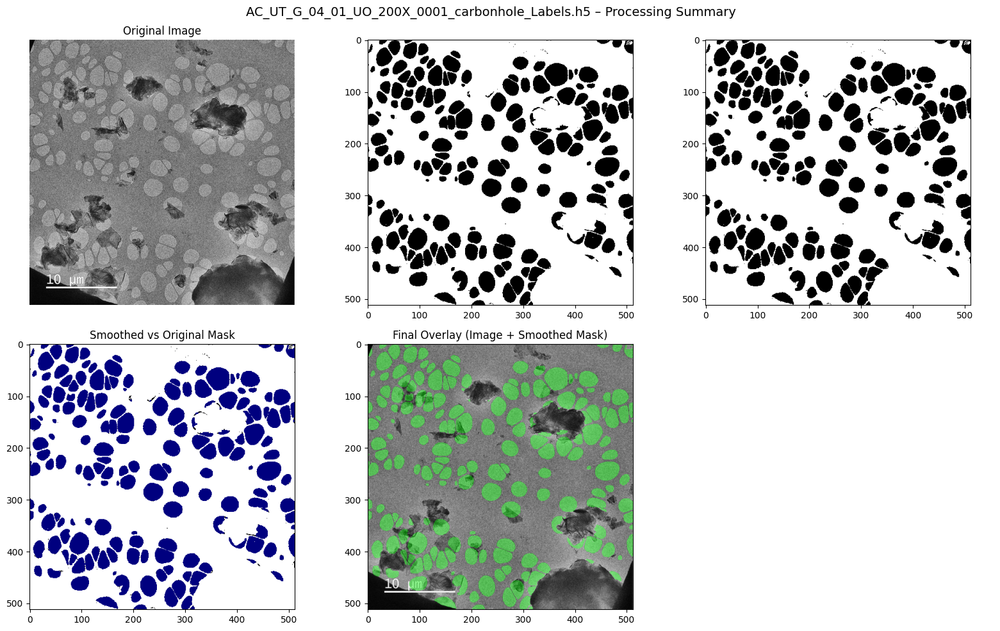

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

✅ Saved to /content/drive/MyDrive/02 ACCORDS/ACC_ImageCharacterisation/notebooks/ilastik/images_normalized/27_06_2026_output_TRAINING_SET_1_prep/Batch_3/masks_output_pipe/AC_UT_G_04_01_UO_200X_0001_carbonhole_processingSummary.pdf

💾 Saving final .png + .npz outputs for U-Net (with sanity-check):
❌ Skipping AC_UT_G_04_01_UO_200X_0001 — missing mask(s): undefined

🚀 Processing: AC_UT_G_04_01_UO_200X_0001_undefined_Labels.h5
📥 Loading raw mask...
🔄 Resizing mask from (1884, 1884) to (512, 512)
✅ Raw mask shape: (512, 512)
   Unique values: [0 1 2]
🧹 Removing class 0 using nearest-neighbor...
✅ Cleaned mask unique values: [1 2]
🔧 Applying binary opening on class 2 (structure 3×3)...
✅ Filtered mask unique values: [1 2]
🔍 Trying: /content/drive/MyDrive/02 ACCORDS/ACC_ImageCharacterisation/notebooks/ilastik/images_normalized/27_06_2026_output_TRAINING_SET_1_prep/Batch_3/AC_UT_G_04_01_UO_200X_0001.tiff
✅ Found: /content/drive/MyDrive/02 ACCORDS/ACC_ImageCharacterisation/notebooks/ilastik/ima

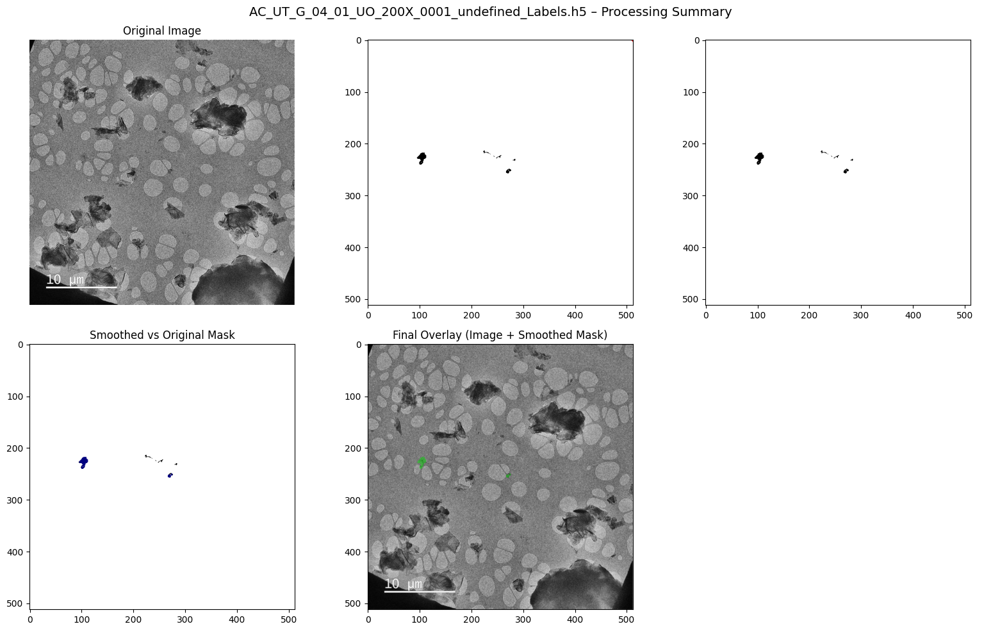

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

✅ Saved to /content/drive/MyDrive/02 ACCORDS/ACC_ImageCharacterisation/notebooks/ilastik/images_normalized/27_06_2026_output_TRAINING_SET_1_prep/Batch_3/masks_output_pipe/AC_UT_G_04_01_UO_200X_0001_undefined_processingSummary.pdf

💾 Saving final .png + .npz outputs for U-Net (with sanity-check):
📊 AC_UT_G_04_01_UO_200X_0001: GFM=50433, carbonhole=77217, undefined=263 ⚠️ Overlapping pixels: 9043
✅ Saved AC_UT_G_04_01_UO_200X_0001.png + AC_UT_G_04_01_UO_200X_0001.npz

🚀 Processing: AC_UT_G_04_01_UO_200X_0003_GFM_Labels.h5
📥 Loading raw mask...
🔄 Resizing mask from (1884, 1884) to (512, 512)
✅ Raw mask shape: (512, 512)
   Unique values: [1 2]
🧹 Removing class 0 using nearest-neighbor...
✅ No class 0 to replace.
✅ Cleaned mask unique values: [1 2]
🔧 Applying binary opening on class 2 (structure 3×3)...
✅ Filtered mask unique values: [1 2]
🔍 Trying: /content/drive/MyDrive/02 ACCORDS/ACC_ImageCharacterisation/notebooks/ilastik/images_normalized/27_06_2026_output_TRAINING_SET_1_prep/Batch_3/

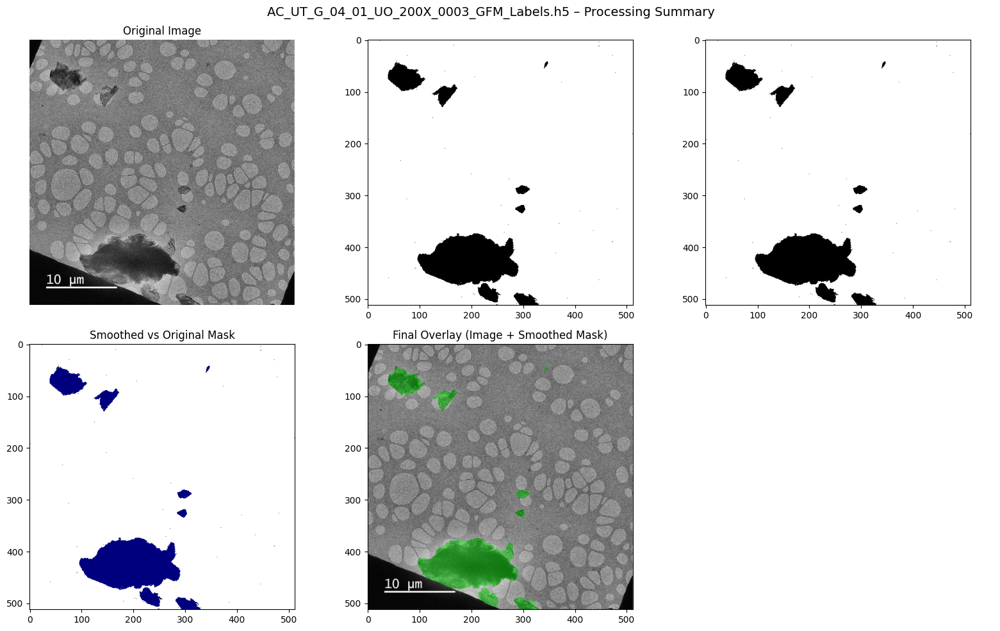

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

✅ Saved to /content/drive/MyDrive/02 ACCORDS/ACC_ImageCharacterisation/notebooks/ilastik/images_normalized/27_06_2026_output_TRAINING_SET_1_prep/Batch_3/masks_output_pipe/AC_UT_G_04_01_UO_200X_0003_GFM_processingSummary.pdf

💾 Saving final .png + .npz outputs for U-Net (with sanity-check):
📊 AC_UT_G_04_01_UO_200X_0001: GFM=50433, carbonhole=77217, undefined=263 ⚠️ Overlapping pixels: 9043
✅ Saved AC_UT_G_04_01_UO_200X_0001.png + AC_UT_G_04_01_UO_200X_0001.npz
❌ Skipping AC_UT_G_04_01_UO_200X_0003 — missing mask(s): carbonhole, undefined

🚀 Processing: AC_UT_G_04_01_UO_200X_0003_carbonhole_Labels.h5
📥 Loading raw mask...
🔄 Resizing mask from (1884, 1884) to (512, 512)
✅ Raw mask shape: (512, 512)
   Unique values: [1 2]
🧹 Removing class 0 using nearest-neighbor...
✅ No class 0 to replace.
✅ Cleaned mask unique values: [1 2]
🔧 Applying binary opening on class 2 (structure 3×3)...
✅ Filtered mask unique values: [1 2]
🔍 Trying: /content/drive/MyDrive/02 ACCORDS/ACC_ImageCharacterisation/no

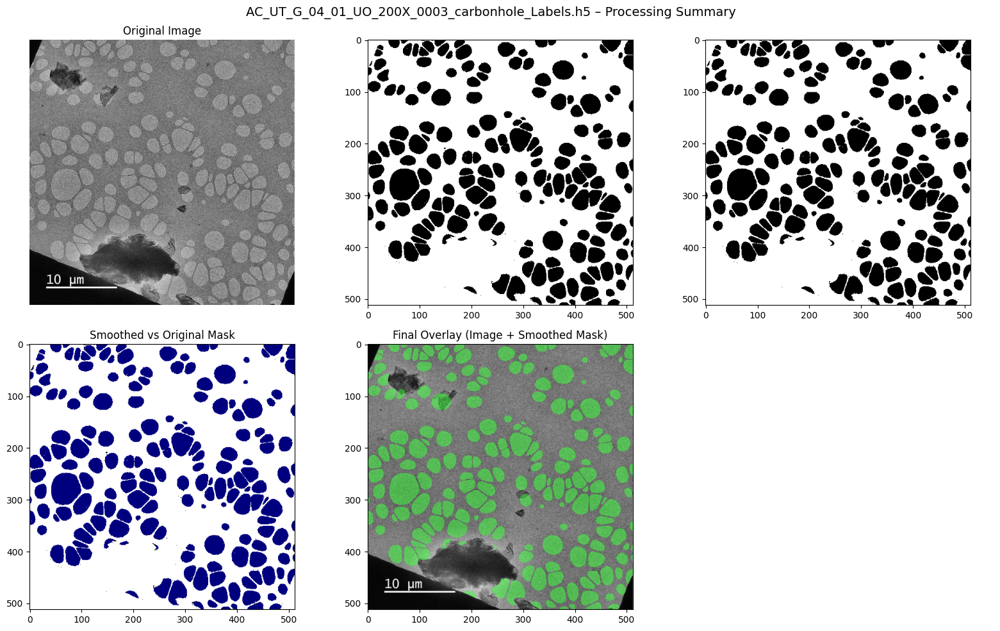

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

✅ Saved to /content/drive/MyDrive/02 ACCORDS/ACC_ImageCharacterisation/notebooks/ilastik/images_normalized/27_06_2026_output_TRAINING_SET_1_prep/Batch_3/masks_output_pipe/AC_UT_G_04_01_UO_200X_0003_carbonhole_processingSummary.pdf

💾 Saving final .png + .npz outputs for U-Net (with sanity-check):
📊 AC_UT_G_04_01_UO_200X_0001: GFM=50433, carbonhole=77217, undefined=263 ⚠️ Overlapping pixels: 9043
✅ Saved AC_UT_G_04_01_UO_200X_0001.png + AC_UT_G_04_01_UO_200X_0001.npz
❌ Skipping AC_UT_G_04_01_UO_200X_0003 — missing mask(s): undefined

🚀 Processing: AC_UT_G_04_01_UO_200X_0003_undefined_Labels.h5
📥 Loading raw mask...
🔄 Resizing mask from (1884, 1884) to (512, 512)
✅ Raw mask shape: (512, 512)
   Unique values: [1 2]
🧹 Removing class 0 using nearest-neighbor...
✅ No class 0 to replace.
✅ Cleaned mask unique values: [1 2]
🔧 Applying binary opening on class 2 (structure 3×3)...
✅ Filtered mask unique values: [1 2]
🔍 Trying: /content/drive/MyDrive/02 ACCORDS/ACC_ImageCharacterisation/notebook

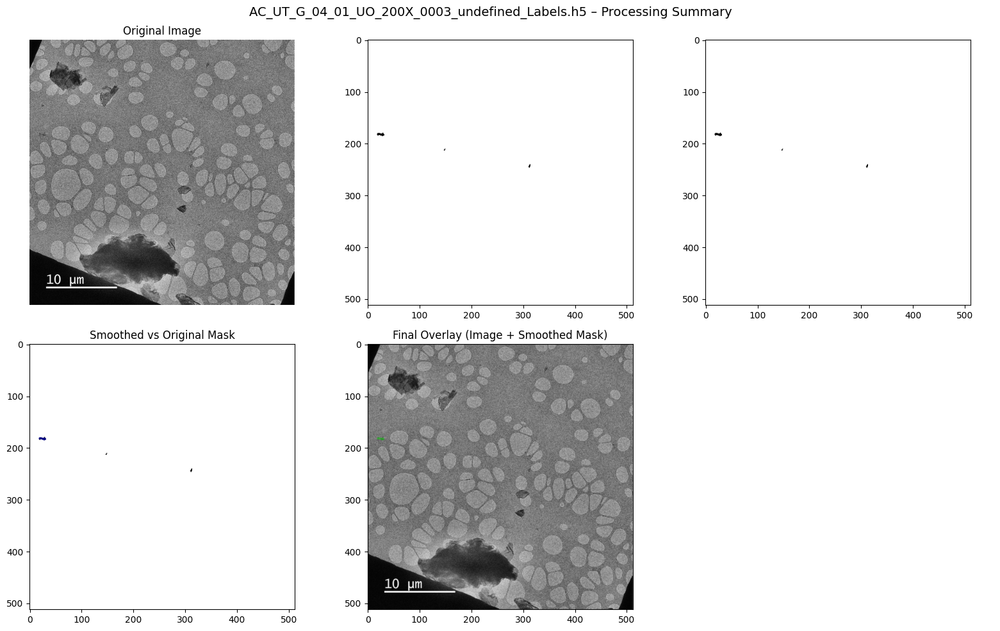

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

✅ Saved to /content/drive/MyDrive/02 ACCORDS/ACC_ImageCharacterisation/notebooks/ilastik/images_normalized/27_06_2026_output_TRAINING_SET_1_prep/Batch_3/masks_output_pipe/AC_UT_G_04_01_UO_200X_0003_undefined_processingSummary.pdf

💾 Saving final .png + .npz outputs for U-Net (with sanity-check):
📊 AC_UT_G_04_01_UO_200X_0001: GFM=50433, carbonhole=77217, undefined=263 ⚠️ Overlapping pixels: 9043
✅ Saved AC_UT_G_04_01_UO_200X_0001.png + AC_UT_G_04_01_UO_200X_0001.npz
📊 AC_UT_G_04_01_UO_200X_0003: GFM=19114, carbonhole=84525, undefined=57 ⚠️ Overlapping pixels: 1184
✅ Saved AC_UT_G_04_01_UO_200X_0003.png + AC_UT_G_04_01_UO_200X_0003.npz

🚀 Processing: AC_UT_G_04_01_UO_200X_0006_GFM_Labels.h5
📥 Loading raw mask...
🔄 Resizing mask from (1884, 1884) to (512, 512)
✅ Raw mask shape: (512, 512)
   Unique values: [1 2]
🧹 Removing class 0 using nearest-neighbor...
✅ No class 0 to replace.
✅ Cleaned mask unique values: [1 2]
🔧 Applying binary opening on class 2 (structure 3×3)...
✅ Filtered mask u

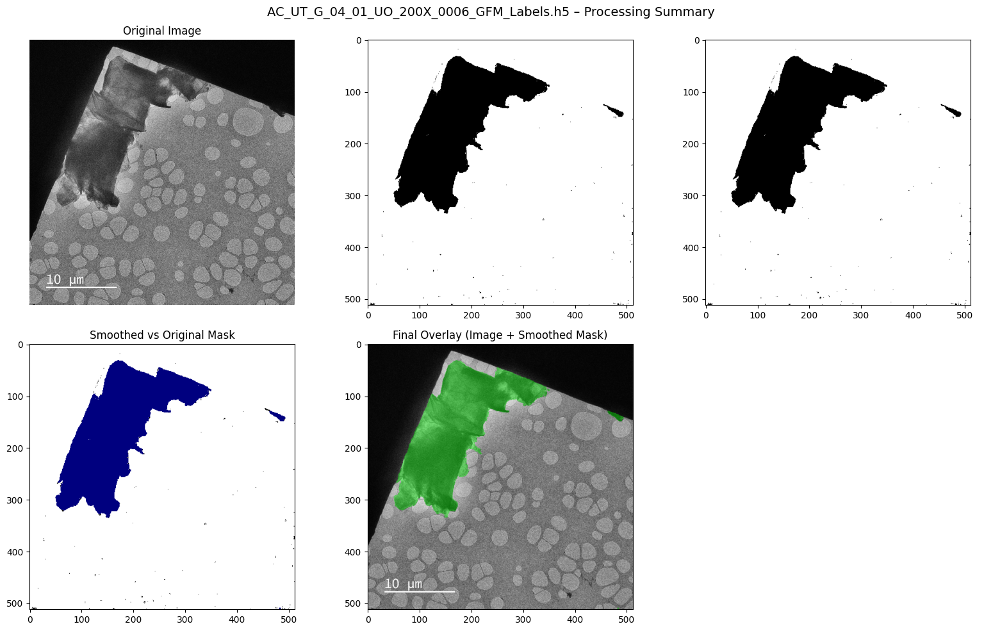

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

✅ Saved to /content/drive/MyDrive/02 ACCORDS/ACC_ImageCharacterisation/notebooks/ilastik/images_normalized/27_06_2026_output_TRAINING_SET_1_prep/Batch_3/masks_output_pipe/AC_UT_G_04_01_UO_200X_0006_GFM_processingSummary.pdf

💾 Saving final .png + .npz outputs for U-Net (with sanity-check):
📊 AC_UT_G_04_01_UO_200X_0001: GFM=50433, carbonhole=77217, undefined=263 ⚠️ Overlapping pixels: 9043
✅ Saved AC_UT_G_04_01_UO_200X_0001.png + AC_UT_G_04_01_UO_200X_0001.npz
📊 AC_UT_G_04_01_UO_200X_0003: GFM=19114, carbonhole=84525, undefined=57 ⚠️ Overlapping pixels: 1184
✅ Saved AC_UT_G_04_01_UO_200X_0003.png + AC_UT_G_04_01_UO_200X_0003.npz
❌ Skipping AC_UT_G_04_01_UO_200X_0006 — missing mask(s): carbonhole, undefined

🚀 Processing: AC_UT_G_04_01_UO_200X_0006_carbonhole_Labels.h5
📥 Loading raw mask...
🔄 Resizing mask from (1884, 1884) to (512, 512)
✅ Raw mask shape: (512, 512)
   Unique values: [1 2]
🧹 Removing class 0 using nearest-neighbor...
✅ No class 0 to replace.
✅ Cleaned mask unique values:

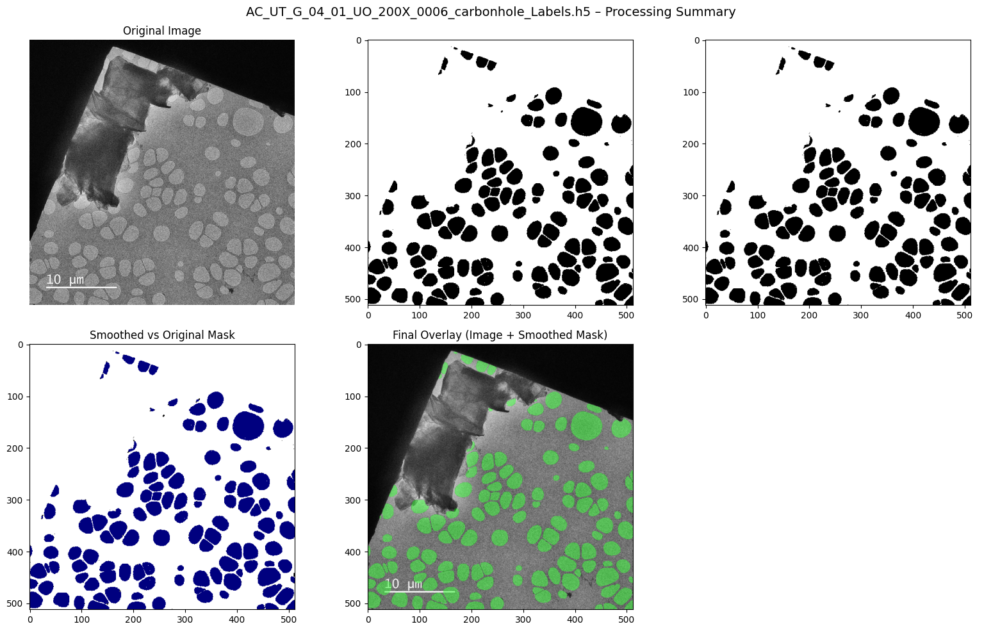

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

✅ Saved to /content/drive/MyDrive/02 ACCORDS/ACC_ImageCharacterisation/notebooks/ilastik/images_normalized/27_06_2026_output_TRAINING_SET_1_prep/Batch_3/masks_output_pipe/AC_UT_G_04_01_UO_200X_0006_carbonhole_processingSummary.pdf

💾 Saving final .png + .npz outputs for U-Net (with sanity-check):
📊 AC_UT_G_04_01_UO_200X_0001: GFM=50433, carbonhole=77217, undefined=263 ⚠️ Overlapping pixels: 9043
✅ Saved AC_UT_G_04_01_UO_200X_0001.png + AC_UT_G_04_01_UO_200X_0001.npz
📊 AC_UT_G_04_01_UO_200X_0003: GFM=19114, carbonhole=84525, undefined=57 ⚠️ Overlapping pixels: 1184
✅ Saved AC_UT_G_04_01_UO_200X_0003.png + AC_UT_G_04_01_UO_200X_0003.npz
❌ Skipping AC_UT_G_04_01_UO_200X_0006 — missing mask(s): undefined

🚀 Processing: AC_UT_G_04_01_UO_200X_0006_undefined_Labels.h5
📥 Loading raw mask...
🔄 Resizing mask from (1884, 1884) to (512, 512)
✅ Raw mask shape: (512, 512)
   Unique values: [1 2]
🧹 Removing class 0 using nearest-neighbor...
✅ No class 0 to replace.
✅ Cleaned mask unique values: [1 2]

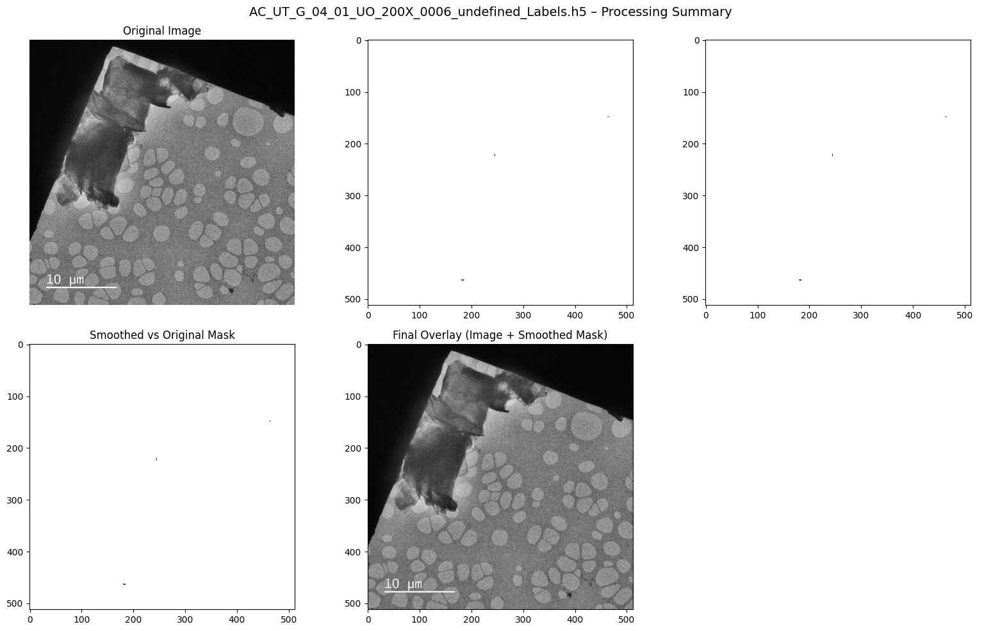

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

✅ Saved to /content/drive/MyDrive/02 ACCORDS/ACC_ImageCharacterisation/notebooks/ilastik/images_normalized/27_06_2026_output_TRAINING_SET_1_prep/Batch_3/masks_output_pipe/AC_UT_G_04_01_UO_200X_0006_undefined_processingSummary.pdf

💾 Saving final .png + .npz outputs for U-Net (with sanity-check):
📊 AC_UT_G_04_01_UO_200X_0001: GFM=50433, carbonhole=77217, undefined=263 ⚠️ Overlapping pixels: 9043
✅ Saved AC_UT_G_04_01_UO_200X_0001.png + AC_UT_G_04_01_UO_200X_0001.npz
📊 AC_UT_G_04_01_UO_200X_0003: GFM=19114, carbonhole=84525, undefined=57 ⚠️ Overlapping pixels: 1184
✅ Saved AC_UT_G_04_01_UO_200X_0003.png + AC_UT_G_04_01_UO_200X_0003.npz
📊 AC_UT_G_04_01_UO_200X_0006: GFM=37676, carbonhole=60245, undefined=0 ⚠️ Overlapping pixels: 308
✅ Saved AC_UT_G_04_01_UO_200X_0006.png + AC_UT_G_04_01_UO_200X_0006.npz

🚀 Processing: AC_UT_G_04_01_UO_200X_0010_GFM_Labels.h5
📥 Loading raw mask...
🔄 Resizing mask from (1884, 1884) to (512, 512)
✅ Raw mask shape: (512, 512)
   Unique values: [1 2]
🧹 Removin

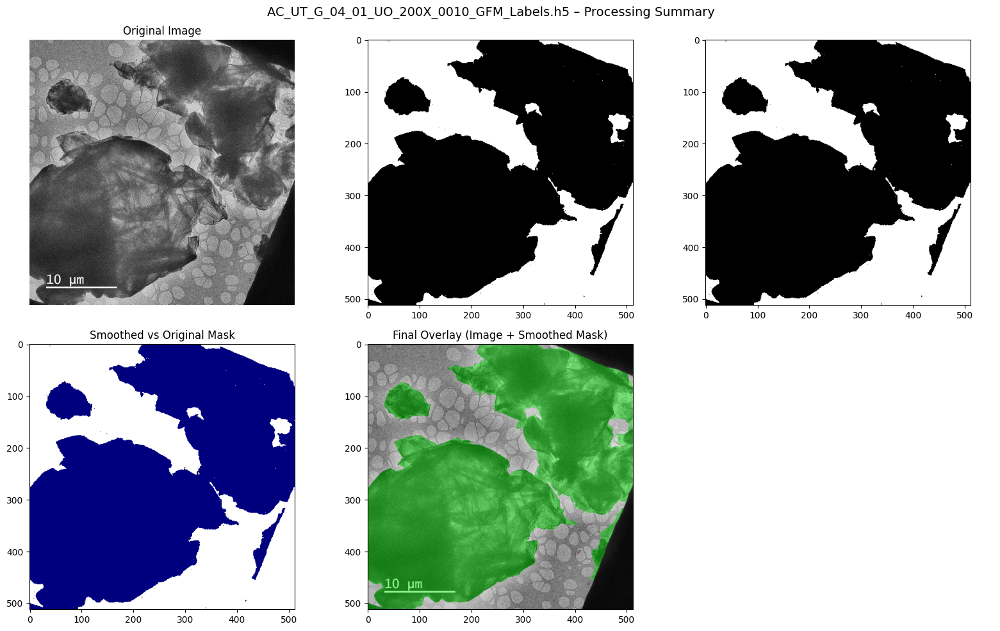

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

✅ Saved to /content/drive/MyDrive/02 ACCORDS/ACC_ImageCharacterisation/notebooks/ilastik/images_normalized/27_06_2026_output_TRAINING_SET_1_prep/Batch_3/masks_output_pipe/AC_UT_G_04_01_UO_200X_0010_GFM_processingSummary.pdf

💾 Saving final .png + .npz outputs for U-Net (with sanity-check):
📊 AC_UT_G_04_01_UO_200X_0001: GFM=50433, carbonhole=77217, undefined=263 ⚠️ Overlapping pixels: 9043
✅ Saved AC_UT_G_04_01_UO_200X_0001.png + AC_UT_G_04_01_UO_200X_0001.npz
📊 AC_UT_G_04_01_UO_200X_0003: GFM=19114, carbonhole=84525, undefined=57 ⚠️ Overlapping pixels: 1184
✅ Saved AC_UT_G_04_01_UO_200X_0003.png + AC_UT_G_04_01_UO_200X_0003.npz
📊 AC_UT_G_04_01_UO_200X_0006: GFM=37676, carbonhole=60245, undefined=0 ⚠️ Overlapping pixels: 308
✅ Saved AC_UT_G_04_01_UO_200X_0006.png + AC_UT_G_04_01_UO_200X_0006.npz
❌ Skipping AC_UT_G_04_01_UO_200X_0010 — missing mask(s): carbonhole, undefined

🚀 Processing: AC_UT_G_04_01_UO_200X_0010_carbonhole_Labels.h5
📥 Loading raw mask...
🔄 Resizing mask from (1884, 18

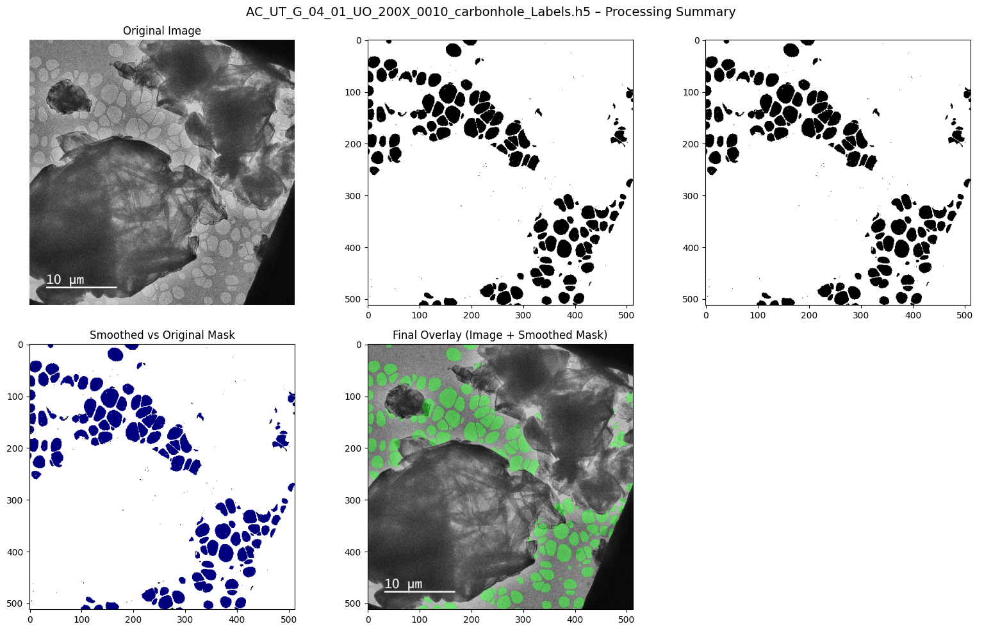

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

✅ Saved to /content/drive/MyDrive/02 ACCORDS/ACC_ImageCharacterisation/notebooks/ilastik/images_normalized/27_06_2026_output_TRAINING_SET_1_prep/Batch_3/masks_output_pipe/AC_UT_G_04_01_UO_200X_0010_carbonhole_processingSummary.pdf

💾 Saving final .png + .npz outputs for U-Net (with sanity-check):
📊 AC_UT_G_04_01_UO_200X_0001: GFM=50433, carbonhole=77217, undefined=263 ⚠️ Overlapping pixels: 9043
✅ Saved AC_UT_G_04_01_UO_200X_0001.png + AC_UT_G_04_01_UO_200X_0001.npz
📊 AC_UT_G_04_01_UO_200X_0003: GFM=19114, carbonhole=84525, undefined=57 ⚠️ Overlapping pixels: 1184
✅ Saved AC_UT_G_04_01_UO_200X_0003.png + AC_UT_G_04_01_UO_200X_0003.npz
📊 AC_UT_G_04_01_UO_200X_0006: GFM=37676, carbonhole=60245, undefined=0 ⚠️ Overlapping pixels: 308
✅ Saved AC_UT_G_04_01_UO_200X_0006.png + AC_UT_G_04_01_UO_200X_0006.npz
❌ Skipping AC_UT_G_04_01_UO_200X_0010 — missing mask(s): undefined

🚀 Processing: AC_UT_G_04_01_UO_200X_0010_undefined_Labels.h5
📥 Loading raw mask...
🔄 Resizing mask from (1884, 1884) to

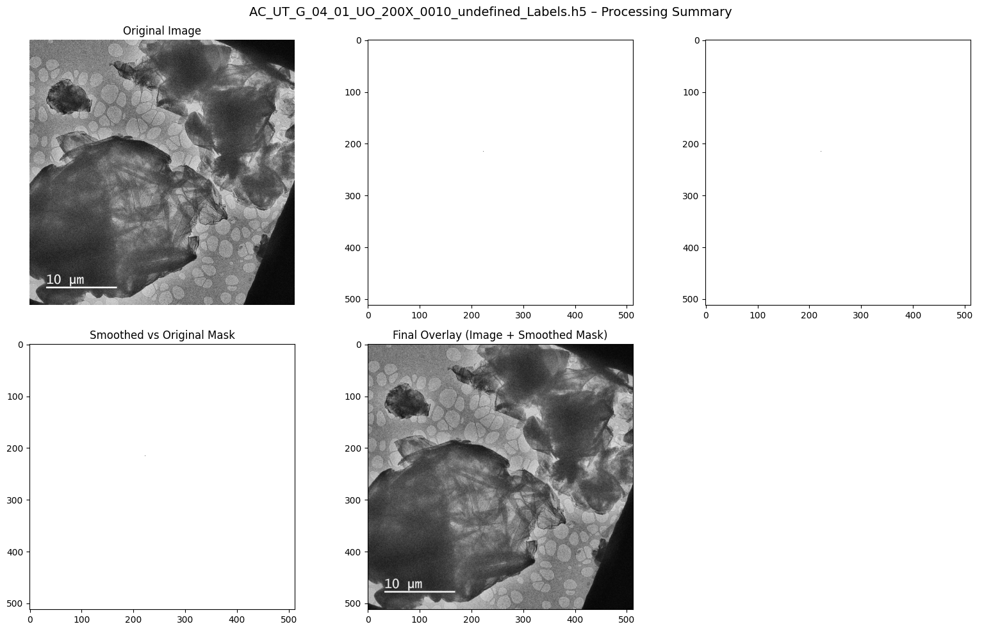

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

✅ Saved to /content/drive/MyDrive/02 ACCORDS/ACC_ImageCharacterisation/notebooks/ilastik/images_normalized/27_06_2026_output_TRAINING_SET_1_prep/Batch_3/masks_output_pipe/AC_UT_G_04_01_UO_200X_0010_undefined_processingSummary.pdf

💾 Saving final .png + .npz outputs for U-Net (with sanity-check):
📊 AC_UT_G_04_01_UO_200X_0001: GFM=50433, carbonhole=77217, undefined=263 ⚠️ Overlapping pixels: 9043
✅ Saved AC_UT_G_04_01_UO_200X_0001.png + AC_UT_G_04_01_UO_200X_0001.npz
📊 AC_UT_G_04_01_UO_200X_0003: GFM=19114, carbonhole=84525, undefined=57 ⚠️ Overlapping pixels: 1184
✅ Saved AC_UT_G_04_01_UO_200X_0003.png + AC_UT_G_04_01_UO_200X_0003.npz
📊 AC_UT_G_04_01_UO_200X_0006: GFM=37676, carbonhole=60245, undefined=0 ⚠️ Overlapping pixels: 308
✅ Saved AC_UT_G_04_01_UO_200X_0006.png + AC_UT_G_04_01_UO_200X_0006.npz
📊 AC_UT_G_04_01_UO_200X_0010: GFM=165382, carbonhole=36714, undefined=0 ⚠️ Overlapping pixels: 2860
✅ Saved AC_UT_G_04_01_UO_200X_0010.png + AC_UT_G_04_01_UO_200X_0010.npz


In [ ]:
target_class = 2
structure_size = 3

# Find all Ilastik label files
label_paths = sorted(glob(os.path.join(BASE_DIR, '*_Labels.h5')))
print(f"Found {len(label_paths)} label files.")

for path in label_paths:
    filename = os.path.basename(path)
    print("\n" + "="*60)
    print(f"🚀 Processing: {filename}")

    # Step 1: Load raw mask
    print("📥 Loading raw mask...")
    raw_mask = load_label_mask(path, target_shape=(512, 512))
    print(f"✅ Raw mask shape: {raw_mask.shape}")
    print(f"   Unique values: {np.unique(raw_mask)}")

    # Step 2: Remove class 0 via nearest-neighbor
    print("🧹 Removing class 0 using nearest-neighbor...")
    cleaned_mask = remove_class_0_with_nearest(raw_mask)
    print(f"✅ Cleaned mask unique values: {np.unique(cleaned_mask)}")

    # Step 3: Apply morphological smoothing
    print(f"🔧 Applying binary opening on class {target_class} (structure {structure_size}×{structure_size})...")
    filtered_mask = simple_smooth_mask(cleaned_mask, target_class=target_class, structure_size=structure_size)
    print(f"✅ Filtered mask unique values: {np.unique(filtered_mask)}")

    image_path = find_corresponding_image(path)
    if image_path is None:
        continue
    image = np.array(Image.open(image_path).convert('L'))

    # Color masks
    raw_rgb = color_mask_rgb(raw_mask)
    cleaned_rgb = color_mask_rgb(cleaned_mask)
    comparison_overlay = overlay_masks(raw_mask, filtered_mask)
    final_overlay = show_overlay(image, filtered_mask, class_value=2, color=(0, 255, 0), alpha=0.4)

    # Create PDF
    base = filename.replace('_Labels.h5', '')
    pdf_path = os.path.join(OUTPUT_DIR, f"{base}_processingSummary.pdf")
    with PdfPages(pdf_path) as pdf:

      fig, axs = plt.subplots(2, 3, figsize=(16, 10))

      # Row 1: Image + raw mask
      axs[0, 0].imshow(image, cmap='gray')
      axs[0, 0].set_title("Original Image")
      axs[0, 1].imshow(raw_rgb)
      # axs[0, 1].set_title("Raw Mask (RGB)")

      # Row 2: Cleaned mask
      axs[0, 2].imshow(cleaned_rgb)

      # Row 3: Original vs Smoothed mask overlay
      axs[1, 0].imshow(comparison_overlay)
      axs[1, 0].set_title("Smoothed vs Original Mask")
      #axs[1, 0].axis('off')

      # Row 4: Final overlay on image
      axs[1, 1].imshow(final_overlay)
      axs[1, 1].set_title("Final Overlay (Image + Smoothed Mask)")
      #axs[1, 1].axis('off')

      # Row 4: Final overlay on image
      axs[1, 2].axis('off')  # Empty cell

      # Cleanup
      for ax in axs.flat:
        ax.axis('off')

        plt.suptitle(f"{filename} – Processing Summary", fontsize=14)
        plt.tight_layout()
        pdf.savefig(fig)
        plt.show()

      print(f"✅ Saved to {pdf_path}")

      print("\n💾 Saving final .png + .npz outputs for U-Net (with sanity-check):")

      # Wyodrębnij base name i klasę z filename
      match = re.match(r'^(.*)_(GFM|carbonhole|undefined)_Labels\.h5$', filename)
      if not match:
          print(f"⚠️ Cannot parse filename: {filename}")
          continue

      img_base, class_name = match.groups()
      class_idx = {'GFM': 0, 'carbonhole': 1, 'undefined': 2}[class_name]

      # Zapisz do multi-label struktury
      mask_channels[img_base][class_idx] = (filtered_mask == 2).astype(np.uint8)

      # Jeśli pierwszy raz, zapisz także obraz (resize jeśli potrzeba)
      if img_base not in images_resized:
          if image.shape != filtered_mask.shape:
              image = resize(image, filtered_mask.shape, preserve_range=True).astype(np.uint8)
          images_resized[img_base] = image

      for base, channels in mask_channels.items():
          missing = [name for i, name in enumerate(['GFM', 'carbonhole', 'undefined']) if channels[i] is None]

          if missing:
              print(f"❌ Skipping {base} — missing mask(s): {', '.join(missing)}")
              continue

          # Stack into (H, W, 3)
          onehot = np.stack(channels, axis=-1)

          # 💡 Sanity-check
          counts = [np.sum(onehot[:, :, i]) for i in range(3)]
          overlap = np.sum(np.sum(onehot, axis=-1) > 1)

          print(f"📊 {base}: GFM={counts[0]}, carbonhole={counts[1]}, undefined={counts[2]}", end='')

          if overlap > 0:
              print(f" ⚠️ Overlapping pixels: {overlap}")
          else:
              print(" ✅ No overlap")

          # Save image
          image_out = os.path.join(UNET_IMAGE_DIR, f"{base}.png")
          cv2.imwrite(image_out, images_resized[base])

          # Save multi-label mask
          mask_out = os.path.join(UNET_MASK_DIR, f"{base}.npz")
          np.savez_compressed(mask_out, mask=onehot)

          print(f"✅ Saved {base}.png + {base}.npz")

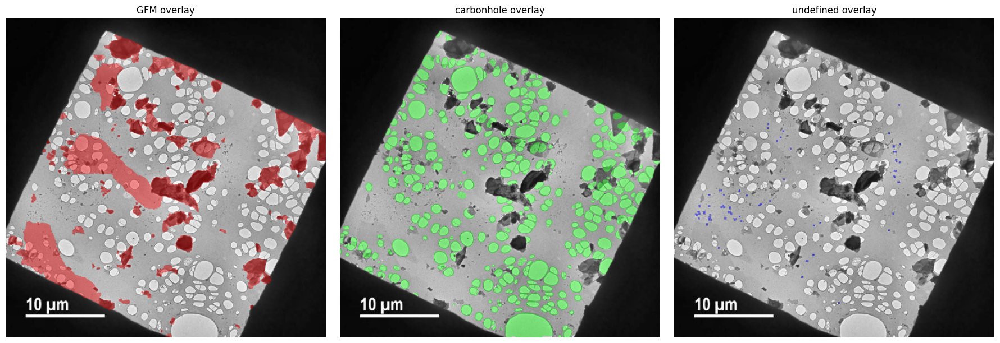

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
import os

# === PARAMETERS ===
example_base = "1AC_UT_GO_02_01_2000X_0002"   # <- change to your file base
image_path = os.path.join(UNET_IMAGE_DIR, f"{example_base}.png")
mask_path = os.path.join(UNET_MASK_DIR, f"{example_base}.npz")

# Load data
image = np.array(Image.open(image_path).convert("L"))
mask = np.load(mask_path)["mask"]  # shape (H, W, 3)

class_names = ["GFM", "carbonhole", "undefined"]
class_colors = [(255, 0, 0), (0, 255, 0), (0, 0, 255)]  # red, green, blue

# Plot
fig, axs = plt.subplots(1, 3, figsize=(18, 6))

for i, (name, color) in enumerate(zip(class_names, class_colors)):
    binary = mask[..., i] > 0
    overlay = np.stack([image]*3, axis=-1).astype(np.float32)
    overlay[binary] = (0.6 * overlay[binary] + 0.4 * np.array(color)).astype(np.float32)
    axs[i].imshow(overlay.astype(np.uint8))
    axs[i].set_title(f"{name} overlay")
    axs[i].axis("off")

plt.tight_layout()
plt.show()
